<a href="https://colab.research.google.com/github/The20thDuck/Neuro-140-Project/blob/main/Celeb_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

I used the PyTorch DCGAN tutorial for reference: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html 

In [3]:
import torch as t
import torchvision
from tqdm import tqdm
import matplotlib.pyplot as plt
from torchvision import transforms
import torchvision.utils as vutils

In [ ]:

# !cp drive/MyDrive/Sophomore/Neuro\ 140/data/img_align_celeba.zip data/celeba
!mkdir -p data/celeba && cp drive/MyDrive/Sophomore/Neuro\ 140/data/celebfaces/* data/celeba
!unzip data/celeba/img_align_celeba.zip


In [5]:
batch_size = 128

transform_func = transforms.Compose([
  transforms.ToTensor(),
  transforms.Resize(size=64),
  transforms.CenterCrop(64),
  transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])
train_data = torchvision.datasets.CelebA('data', split='train', download=True, 
                                         transform=transform_func)
test_data = torchvision.datasets.CelebA('data', split='test', download=True, transform=transform_func)

get_loader = lambda d: t.utils.data.DataLoader(d, batch_size=batch_size, shuffle=True, num_workers = 2)
train_loader = get_loader(train_data)
test_loader = get_loader(test_data)

Using downloaded and verified file: data/celeba/img_align_celeba.zip
Using downloaded and verified file: data/celeba/list_attr_celeba.txt


0it [00:00, ?it/s]

Using downloaded and verified file: data/celeba/list_bbox_celeba.txt
Using downloaded and verified file: data/celeba/list_landmarks_align_celeba.txt
Using downloaded and verified file: data/celeba/list_eval_partition.txt
Files already downloaded and verified


torch.Size([3, 64, 64])


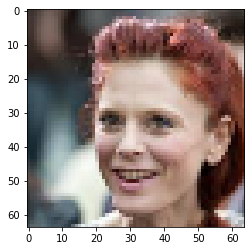

In [6]:
plt.imshow(transforms.ToPILImage()(vutils.make_grid(train_data[1][0], normalize=True)))
print(train_data[1][0].shape)

In [7]:
latent_size = 100
nhc = 64 # number of hidden channels
class Discriminator(t.nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = t.nn.Sequential(
        t.nn.Conv2d(3, nhc, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc),
        t.nn.LeakyReLU(0.2),
        t.nn.Conv2d(nhc, nhc*2, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc*2),
        t.nn.LeakyReLU(0.2),
        t.nn.Conv2d(nhc*2, nhc*4, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc*4),
        t.nn.LeakyReLU(0.2),
        t.nn.Conv2d(nhc*4, nhc*8, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc*8),
        t.nn.LeakyReLU(0.2),
        t.nn.Conv2d(nhc*8, 1, 4, 1, 0, bias=False),
        t.nn.Sigmoid()
    )
    
  def forward(self, x):
    return self.layers(x)

class Generator(t.nn.Module):
  def __init__(self, latent_size = latent_size):
    super().__init__()
    self.layers = t.nn.Sequential(
        t.nn.ConvTranspose2d(latent_size, nhc*8, 4, 1, 0, bias=False),
        t.nn.BatchNorm2d(nhc*8),
        t.nn.ReLU(True),
        t.nn.ConvTranspose2d(nhc*8, nhc*4, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc*4),
        t.nn.ReLU(True),
        t.nn.ConvTranspose2d(nhc*4, nhc*2, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc*2),
        t.nn.ReLU(True),
        t.nn.ConvTranspose2d(nhc*2, nhc, 4, 2, 1, bias=False),
        t.nn.BatchNorm2d(nhc),
        t.nn.ReLU(True),
        t.nn.ConvTranspose2d(nhc, 3, 4, 2, 1, bias=False),
        t.nn.Tanh()
    )
  
  def forward(self, x):
    return self.layers(x)

In [8]:
def init_weights(m):
  if isinstance(m, t.nn.Conv2d) or isinstance(m, t.nn.ConvTranspose2d):
    m.weight.data.normal_(0, 0.02)



In [9]:
## Training
generator = Generator().cuda()
discriminator = Discriminator().cuda()

g_optimizer = t.optim.Adam(generator.parameters(), lr = 0.0002, betas=(0.5, .999))
d_optimizer = t.optim.Adam(discriminator.parameters(), lr = 0.0002, betas=(0.5, .999))

generator.apply(init_weights)
discriminator.apply(init_weights)

Discriminator(
  (layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (13): Sigmoid()


In [10]:
num_epochs = 5
real_prob = 1.0 # change to 0.9 for one-sided smoothing

d_losses, g_losses = [], []
img_list = []
fixed_noise = t.randn((64, latent_size, 1, 1)).cuda()

for epoch in range(num_epochs):
  for step, (x, y) in enumerate(tqdm(train_loader)):
    # zero grad
    generator.zero_grad()
    discriminator.zero_grad()
    # generate fake images
    with t.no_grad():
      z = t.randn((x.shape[0], latent_size, 1, 1))
      z = z.cuda()
    samples = generator(z)

    # get predictions
    x = x.cuda()
    preds_real = discriminator(x)
    preds_samples = discriminator(samples)

    # update generator
    samples = generator(z)
    preds_samples = discriminator(samples)
    loss_g = t.nn.BCELoss()(preds_samples, t.ones(preds_real.shape).cuda()) # non-saturating heuristic
    g_losses.append(loss_g.item())

    loss_g.backward()
    g_optimizer.step()

    # update discriminator
    discriminator.zero_grad()
    loss_real = t.nn.BCELoss()(preds_real, t.full(preds_real.shape, real_prob).cuda())
    preds_samples_2 = discriminator(samples.detach())
    loss_samples = t.nn.BCELoss()(preds_samples_2, t.zeros(preds_samples.shape).cuda())
    loss_d = loss_real + loss_samples # no one-sided smoothing
    d_losses.append(loss_d.item())
    if step % 500 == 0:
      print(f'd loss:{t.tensor(d_losses).mean():.3f}, g loss: {t.tensor(g_losses).mean():.3f}, D(G(z)): {preds_samples.detach().mean():.4f}, D(x): {preds_real.detach().mean():.3f}')
      with t.no_grad():
        samples = generator(fixed_noise)
      img_list.append(vutils.make_grid(samples.cpu(), normalize=True))
    # calc gradients and step optimizers
    loss_d.backward()
    d_optimizer.step()


 


  0%|          | 2/1272 [00:01<11:48,  1.79it/s]

d loss:1.448, g loss: 1.108, D(G(z)): 0.4070, D(x): 0.507


 39%|███▉      | 501/1272 [01:36<02:33,  5.01it/s]

d loss:0.628, g loss: 6.162, D(G(z)): 0.3038, D(x): 0.907


 79%|███████▉  | 1002/1272 [03:16<00:55,  4.82it/s]

d loss:0.614, g loss: 4.507, D(G(z)): 0.2246, D(x): 0.915


  0%|          | 2/1272 [00:00<06:38,  3.19it/s]

d loss:0.597, g loss: 4.153, D(G(z)): 0.2688, D(x): 0.965


 39%|███▉      | 502/1272 [01:36<02:14,  5.74it/s]

d loss:0.581, g loss: 3.801, D(G(z)): 0.0191, D(x): 0.805


 79%|███████▊  | 1001/1272 [03:12<00:51,  5.25it/s]

d loss:0.566, g loss: 3.620, D(G(z)): 0.0743, D(x): 0.782


  0%|          | 2/1272 [00:00<06:35,  3.21it/s]

d loss:0.553, g loss: 3.570, D(G(z)): 0.4024, D(x): 0.983


 39%|███▉      | 502/1272 [01:34<02:24,  5.32it/s]

d loss:0.540, g loss: 3.480, D(G(z)): 0.0342, D(x): 0.774


 79%|███████▉  | 1002/1272 [03:08<00:47,  5.66it/s]

d loss:0.532, g loss: 3.404, D(G(z)): 0.0886, D(x): 0.835


  0%|          | 2/1272 [00:00<06:45,  3.13it/s]

d loss:0.529, g loss: 3.363, D(G(z)): 0.1176, D(x): 0.946


 39%|███▉      | 501/1272 [01:33<02:30,  5.12it/s]

d loss:0.536, g loss: 3.289, D(G(z)): 0.0360, D(x): 0.885


 79%|███████▊  | 1001/1272 [03:07<00:51,  5.29it/s]

d loss:0.541, g loss: 3.211, D(G(z)): 0.5457, D(x): 0.949


  0%|          | 2/1272 [00:00<06:23,  3.31it/s]

d loss:0.543, g loss: 3.170, D(G(z)): 0.0439, D(x): 0.777


 39%|███▉      | 502/1272 [01:35<02:14,  5.73it/s]

d loss:0.550, g loss: 3.108, D(G(z)): 0.3319, D(x): 0.919


 79%|███████▊  | 1001/1272 [03:08<00:51,  5.27it/s]

d loss:0.557, g loss: 3.051, D(G(z)): 0.0482, D(x): 0.456


100%|██████████| 1272/1272 [04:00<00:00,  5.30it/s]


In [11]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import numpy as np

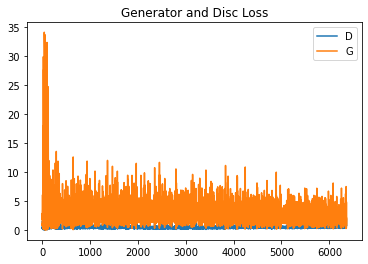

In [12]:
n = len(d_losses)
plt.plot(range(n), d_losses, label="D")
plt.plot(range(n), g_losses, label="G")
plt.title("Generator and Disc Loss")
plt.legend()
plt.show()

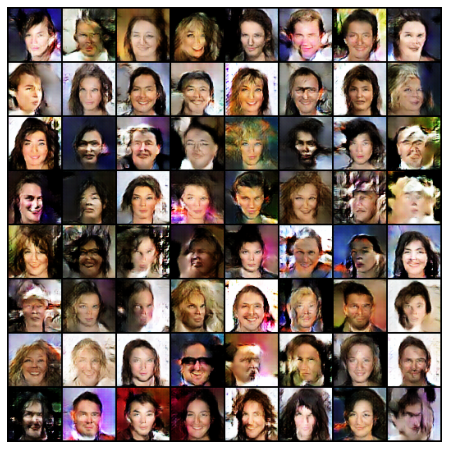

In [13]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [17]:
ani.save("dcgan_celeb.mp4")

torch.Size([3, 64, 64])


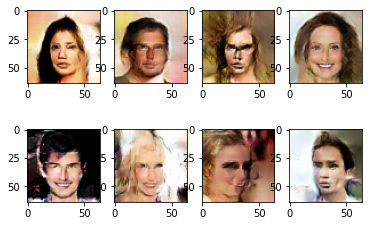

In [16]:
with t.no_grad():
  z = t.randn((batch_size, latent_size, 1, 1))
  z = z.cuda()
  samples = generator(z)
  print(samples[0].shape)
for i in range(8):
  plt.subplot(2, 4, i+1)
  plt.imshow(transforms.ToPILImage()(vutils.make_grid(samples[i].cpu(), normalize=True)))